In [1]:
# standard modules
import os
import math
import random
from datetime import datetime

# myself modules
from config import setting
from module import const
from module import image_loader  # get_train_transform, LoadDataSet
from module import machine_learning_model  # UNet
from module import machine_learning_metrics  # DiceBCELoss, DiceLoss, IoU

import torch

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

const.CHECKPOINT_PATH_UNet = setting.const.CHECKPOINT_PATH + "/UNet"

config directory has been initialized as a package
module directory has been initialized as a package


In [2]:
const.IMG_HEIGHT = 256
const.IMG_WIDTH = 256

const.NUM_EPOCHS = 300
# const.NUM_EPOCHS = 10

In [3]:
# データセットを確認する
train_dataset = image_loader.LoadDataSet(
    setting.const.TRAIN_PATH,
    const.IMG_HEIGHT,
    const.IMG_WIDTH,
    transform=image_loader.get_train_transform(const.IMG_HEIGHT, const.IMG_WIDTH),
)

# 辞書型のときに要素を取得するマジックメソッド. 以下と同じ意味
# image, mask = train_dataset.__getitem__(0)
image, mask = train_dataset[0]
print(image.shape)
print(mask.shape)

# Print total number of unique images.
# フォルダーの長さを表示. 以下と同じ意味
train_dataset.__len__()
print(len(train_dataset))

torch.Size([3, 256, 256])
torch.Size([256, 256, 1])
60


[24, 59, 13]


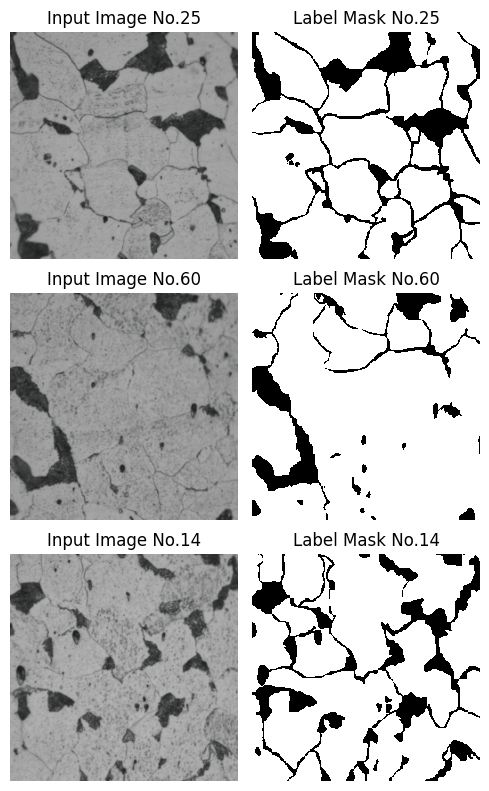

In [4]:
def format_image(img):
    img = np.array(np.transpose(img, (1, 2, 0)))
    # 下は画像拡張での正規化を元に戻しています
    mean = np.array((0.485, 0.456, 0.406))
    std = np.array((0.229, 0.224, 0.225))
    img = std * img + mean
    img = img * 255
    img = img.astype(np.uint8)
    return img


def format_mask(mask):
    mask = np.squeeze(np.transpose(mask, (1, 2, 0)))
    # TODO:なぜかLoadDataSetで反転する
    mask = np.rot90(mask, k=3)
    mask = np.flip(mask, axis=1)
    return mask


def visualize_dataset(n_images, num_range, predict=None):
    # TODO:表示時に水平・垂直クリップがかるからかからないようにする(Predictedのほうも)
    images = random.sample(range(0, num_range), n_images)
    figure, ax = plt.subplots(nrows=len(images), ncols=2, figsize=(5, 8))
    print(images)
    for i in range(0, len(images)):
        img_no = images[i]
        image, mask = train_dataset[i]
        image = format_image(image)
        mask = format_mask(mask)
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest", cmap="gray")
        ax[i, 0].set_title(f"Input Image No.{img_no+1}")
        ax[i, 1].set_title(f"Label Mask No.{img_no+1}")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()


num_range = len(train_dataset)
visualize_dataset(3, num_range)

In [5]:
split_ratio = 0.25
train_size = int(np.round(train_dataset.__len__() * (1 - split_ratio), 0))
valid_size = int(np.round(train_dataset.__len__() * split_ratio, 0))
train_data, valid_data = random_split(train_dataset, [train_size, valid_size])
train_loader = DataLoader(dataset=train_data, batch_size=10, shuffle=True)
val_loader = DataLoader(dataset=valid_data, batch_size=10)

print("Length of train data: {}".format(len(train_data)))
print("Length of validation data: {}".format(len(valid_data)))

Length of train data: 45
Length of validation data: 15


In [6]:
# <---------------各インスタンス作成---------------------->
model = machine_learning_model.UNet(3, 1).cuda()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = machine_learning_metrics.DiceLoss()
accuracy_metric = machine_learning_metrics.IoU()

valid_loss_min = np.Inf

best_model_file = "/best_model.pth"

total_train_loss = []
total_train_score = []
total_valid_loss = []
total_valid_score = []

losses_value = 0
for epoch in range(const.NUM_EPOCHS):
    # <---------------トレーニング---------------------->
    train_loss = []
    train_score = []
    valid_loss = []
    valid_score = []
    pbar = tqdm(train_loader, desc="description")
    for x_train, y_train in pbar:
        x_train = torch.autograd.Variable(x_train).cuda()
        y_train = torch.autograd.Variable(y_train).cuda()
        optimizer.zero_grad()
        output = model(x_train)
        ## 損失計算
        loss = criterion(output, y_train)
        losses_value = loss.item()
        ## 精度評価
        score = accuracy_metric(output, y_train)
        loss.backward()
        optimizer.step()
        train_loss.append(losses_value)
        train_score.append(score.item())
        pbar.set_description(f"Epoch: {epoch+1}, loss: {losses_value}, IoU: {score}")
    # <---------------評価---------------------->
    with torch.no_grad():
        for image, mask in val_loader:
            image = torch.autograd.Variable(image).cuda()
            mask = torch.autograd.Variable(mask).cuda()
            output = model(image)
            ## 損失計算
            loss = criterion(output, mask)
            losses_value = loss.item()
            ## 精度評価
            score = accuracy_metric(output, mask)
            valid_loss.append(losses_value)
            valid_score.append(score.item())

    total_train_loss.append(np.mean(train_loss))
    total_train_score.append(np.mean(train_score))
    total_valid_loss.append(np.mean(valid_loss))
    total_valid_score.append(np.mean(valid_score))
    print(f"Train Loss: {total_train_loss[-1]}, Train IOU: {total_train_score[-1]}")
    print(f"Valid Loss: {total_valid_loss[-1]}, Valid IOU: {total_valid_score[-1]}")

    checkpoint = {
        "epoch": epoch + 1,
        "valid_loss_min": total_valid_loss[-1],
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }

    ## 容量をとるので必要になったら保存する
    # checkpoint_file = "/checkpoint_{}_weight.pth".format(epoch+1)
    # checkpointの保存
    # torch.save(checkpoint, CHECKPOINT_PATH_UNet + checkpoint_file)

    # 評価データにおいて最高精度のモデルのcheckpointの保存
    if total_valid_loss[-1] <= valid_loss_min:
        print(
            "Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...".format(
                valid_loss_min, total_valid_loss[-1]
            )
        )
        torch.save(checkpoint, const.CHECKPOINT_PATH_UNet + best_model_file)
        valid_loss_min = total_valid_loss[-1]

    print("")

Epoch: 1, loss: 0.12316463906118191, IoU: 0.7806833625746465: 100%|█| 5/5 [00:02<00:00,  1.9


Train Loss: 0.1725406228620887, Train IOU: 0.7192727344281842
Valid Loss: 0.09708646403300697, Valid IOU: 0.8230391020443539
Validation loss decreased (inf --> 0.097086).  Saving model ...



Epoch: 2, loss: 0.12330590088766613, IoU: 0.7804594695897482: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.09789290188892466, Train IOU: 0.8223379945864722
Valid Loss: 0.07954942851379876, Valid IOU: 0.8528570140062228
Validation loss decreased (0.097086 --> 0.079549).  Saving model ...



Epoch: 3, loss: 0.07323908111124067, IoU: 0.863517977000264: 100%|█| 5/5 [00:00<00:00,  5.34


Train Loss: 0.08402066021901688, Train IOU: 0.8451483594618624
Valid Loss: 0.06414939578592627, Valid IOU: 0.8794441109432343
Validation loss decreased (0.079549 --> 0.064149).  Saving model ...



Epoch: 4, loss: 0.07115045990523694, IoU: 0.8671516884781908: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.08072696702809486, Train IOU: 0.8524015020877196
Valid Loss: 0.06594362789866137, Valid IOU: 0.8763376421870352



Epoch: 5, loss: 0.060243920423912356, IoU: 0.8863586281561604: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.060498590504346715, Train IOU: 0.8860114923804746
Valid Loss: 0.06904812084171102, Valid IOU: 0.8710326863925213



Epoch: 6, loss: 0.12283226158498939, IoU: 0.7812104776853106: 100%|█| 5/5 [00:01<00:00,  4.8


Train Loss: 0.0809316269651565, Train IOU: 0.8525722447653727
Valid Loss: 0.06536045830370418, Valid IOU: 0.8773017513900341



Epoch: 7, loss: 0.138737666935985, IoU: 0.7563314721758227: 100%|█| 5/5 [00:00<00:00,  5.15i


Train Loss: 0.07566549202190524, Train IOU: 0.8609251714502267
Valid Loss: 0.10030510249072722, Valid IOU: 0.8178564413296836



Epoch: 8, loss: 0.13374170581772327, IoU: 0.7640708965326574: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.08877996923856428, Train IOU: 0.8381566850367077
Valid Loss: 0.05898349337299308, Valid IOU: 0.888607192098223
Validation loss decreased (0.064149 --> 0.058983).  Saving model ...



Epoch: 9, loss: 0.06675713570632691, IoU: 0.8748412723542598: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.0662637652094692, Train IOU: 0.8762962705132697
Valid Loss: 0.059630628258178775, Valid IOU: 0.8874512104153598



Epoch: 10, loss: 0.06101831008650538, IoU: 0.8849819174455655: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.060853100508915195, Train IOU: 0.885503449971259
Valid Loss: 0.06770359892339928, Valid IOU: 0.8733006844835172



Epoch: 11, loss: 0.07730671963524627, IoU: 0.8564818863380506: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06683225771554122, Train IOU: 0.8757568630952808
Valid Loss: 0.08579480288027791, Valid IOU: 0.8427885469612343



Epoch: 12, loss: 0.057577339258999216, IoU: 0.8911149722320452: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05518170108530736, Train IOU: 0.8955814077573976
Valid Loss: 0.0660444617822118, Valid IOU: 0.8765238168510409



Epoch: 13, loss: 0.03846589948933998, IoU: 0.9259180356720164: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06332661309163053, Train IOU: 0.8823299629855461
Valid Loss: 0.06785788866875003, Valid IOU: 0.8732730130521555



Epoch: 14, loss: 0.05438627389732964, IoU: 0.8968382453493253: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06616523907172847, Train IOU: 0.8762759606900135
Valid Loss: 0.08422210455327439, Valid IOU: 0.8457020861176101



Epoch: 15, loss: 0.05567754295737004, IoU: 0.8945180993320917: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.054876308439177325, Train IOU: 0.8960732819667007
Valid Loss: 0.05987170080111198, Valid IOU: 0.8873308801861141



Epoch: 16, loss: 0.050364077314221434, IoU: 0.9041018516130686: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.06165752210787216, Train IOU: 0.8844547453533036
Valid Loss: 0.0602987404327997, Valid IOU: 0.8865390192564087



Epoch: 17, loss: 0.11083615003539571, IoU: 0.8004460125579245: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06371375938915638, Train IOU: 0.8812065948162896
Valid Loss: 0.0645937632582691, Valid IOU: 0.8788334910976966



Epoch: 18, loss: 0.0829959244665871, IoU: 0.8467294301194923: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.061092680782963794, Train IOU: 0.8853155012054685
Valid Loss: 0.07123619834220357, Valid IOU: 0.8677272269341945



Epoch: 19, loss: 0.03822589017169231, IoU: 0.9263632807026612: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.053855221000260835, Train IOU: 0.8984026385338442
Valid Loss: 0.07479155599360271, Valid IOU: 0.8619353625180612



Epoch: 20, loss: 0.11043582503249849, IoU: 0.8010952883329125: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.062062166399473706, Train IOU: 0.8841371428695675
Valid Loss: 0.0816571162252589, Valid IOU: 0.8508272783940247



Epoch: 21, loss: 0.03936311154328165, IoU: 0.9242554698356681: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05037963086906279, Train IOU: 0.9043324907852682
Valid Loss: 0.08026989811191115, Valid IOU: 0.852836699176974



Epoch: 22, loss: 0.04242224661158356, IoU: 0.9186085337578261: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04923379532466794, Train IOU: 0.906187398172556
Valid Loss: 0.07280906369998802, Valid IOU: 0.8656679344887643



Epoch: 23, loss: 0.10090223023072753, IoU: 0.8166923111397135: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06116836176741251, Train IOU: 0.8856324075367267
Valid Loss: 0.0668844452543656, Valid IOU: 0.8753663266767909



Epoch: 24, loss: 0.05407812106587673, IoU: 0.8973928174996639: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0595500140703342, Train IOU: 0.8884929336746034
Valid Loss: 0.0598186218065917, Valid IOU: 0.8872842082072075



Epoch: 25, loss: 0.057548624329322284, IoU: 0.8911662631950272: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.055256838038234155, Train IOU: 0.8954584596344837
Valid Loss: 0.07567356808752684, Valid IOU: 0.8604799114890217



Epoch: 26, loss: 0.06743850838627097, IoU: 0.8736445339218011: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05428469716377697, Train IOU: 0.8971896394155768
Valid Loss: 0.07862935604125781, Valid IOU: 0.8555757493845698



Epoch: 27, loss: 0.04787425758829378, IoU: 0.9086261790467096: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.050008647535647974, Train IOU: 0.9048272194136857
Valid Loss: 0.07901070877906652, Valid IOU: 0.8553057131957555



Epoch: 28, loss: 0.033120225202994846, IoU: 0.9358832848318127: 100%|█| 5/5 [00:01<00:00,  3


Train Loss: 0.04989657946728345, Train IOU: 0.905364548338167
Valid Loss: 0.08031998862199446, Valid IOU: 0.8536562177158229



Epoch: 29, loss: 0.08159676343480915, IoU: 0.8491184510296262: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05449767194665813, Train IOU: 0.8970206203548831
Valid Loss: 0.07658006596604794, Valid IOU: 0.8592008416580782



Epoch: 30, loss: 0.06861496907900022, IoU: 0.8715819301873968: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.053671469371407696, Train IOU: 0.8983163610323718
Valid Loss: 0.09756075384108093, Valid IOU: 0.8249026241681316



Epoch: 31, loss: 0.09554752750994544, IoU: 0.8255717189939064: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05461930803087851, Train IOU: 0.8971252010459475
Valid Loss: 0.08122649807811527, Valid IOU: 0.8522211616152324



Epoch: 32, loss: 0.06661248589994861, IoU: 0.8750955871493442: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05151888880349953, Train IOU: 0.9021550068886388
Valid Loss: 0.09113461509566795, Valid IOU: 0.8359340375264561



Epoch: 33, loss: 0.04632301734328148, IoU: 0.9114559604205895: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0508493320596813, Train IOU: 0.9032829247862324
Valid Loss: 0.09204954104098445, Valid IOU: 0.8340831790697083



Epoch: 34, loss: 0.0382582234982336, IoU: 0.9263032717150935: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.05102291296891996, Train IOU: 0.9030208246366813
Valid Loss: 0.07483172193302112, Valid IOU: 0.8620757444761735



Epoch: 35, loss: 0.08619952392921637, IoU: 0.84128266255267: 100%|█| 5/5 [00:00<00:00,  5.38


Train Loss: 0.062296319338514275, Train IOU: 0.8832817060076126
Valid Loss: 0.05721577816942658, Valid IOU: 0.8920542727538805
Validation loss decreased (0.058983 --> 0.057216).  Saving model ...



Epoch: 36, loss: 0.1754113824756084, IoU: 0.7015327734614974: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.07643639714453165, Train IOU: 0.8618622650349093
Valid Loss: 0.06334275936967654, Valid IOU: 0.8809990380790101



Epoch: 37, loss: 0.05668203444597819, IoU: 0.8927172626298779: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06099522352418265, Train IOU: 0.8851310889019898
Valid Loss: 0.067968618205417, Valid IOU: 0.8731421730149143



Epoch: 38, loss: 0.09802159185847525, IoU: 0.8214582377761347: 100%|█| 5/5 [00:01<00:00,  3.


Train Loss: 0.05962181089389131, Train IOU: 0.8880989164125163
Valid Loss: 0.06892105844728846, Valid IOU: 0.8719676749261757



Epoch: 39, loss: 0.037996629865610365, IoU: 0.9267887325134614: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.052373809198368516, Train IOU: 0.9005699928965052
Valid Loss: 0.09220304512338368, Valid IOU: 0.8328491270595515



Epoch: 40, loss: 0.06217852950796032, IoU: 0.8829229273777051: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.05249377565648037, Train IOU: 0.9002999161898144
Valid Loss: 0.08320137850459852, Valid IOU: 0.8478229211047813



Epoch: 41, loss: 0.04884837107546669, IoU: 0.9068535753101682: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.050530323217445196, Train IOU: 0.9038943043208038
Valid Loss: 0.07305382953606859, Valid IOU: 0.8651160777766197



Epoch: 42, loss: 0.05378436441685264, IoU: 0.8979217510927295: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05628500611935385, Train IOU: 0.8939417485904102
Valid Loss: 0.08131227328250967, Valid IOU: 0.8514984422515111



Epoch: 43, loss: 0.04735488924154396, IoU: 0.9095726726632527: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05574450815281633, Train IOU: 0.8947322864595373
Valid Loss: 0.08235501392782246, Valid IOU: 0.8487829653368631



Epoch: 44, loss: 0.10319405095873546, IoU: 0.8129182272969344: 100%|█| 5/5 [00:01<00:00,  3.


Train Loss: 0.06373947008701755, Train IOU: 0.8808308709553121
Valid Loss: 0.07851671573645752, Valid IOU: 0.8557048441136259



Epoch: 45, loss: 0.0509772331392041, IoU: 0.9029910808778694: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.051463602467815964, Train IOU: 0.9021840985793691
Valid Loss: 0.08318590691857225, Valid IOU: 0.8486699589157141



Epoch: 46, loss: 0.05979802396235534, IoU: 0.8871523386218994: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05182502773847242, Train IOU: 0.9015375225994081
Valid Loss: 0.07212819180871488, Valid IOU: 0.8665734287674908



Epoch: 47, loss: 0.05659932928191869, IoU: 0.8928653688623949: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05163826577270723, Train IOU: 0.9020025342388811
Valid Loss: 0.07126176012471014, Valid IOU: 0.8680838222139707



Epoch: 48, loss: 0.07682775165325728, IoU: 0.8573076795787907: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05132847489357606, Train IOU: 0.902740984204683
Valid Loss: 0.09120070043424461, Valid IOU: 0.8357568252511168



Epoch: 49, loss: 0.04635627837472167, IoU: 0.9113950716307728: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.047916995892399485, Train IOU: 0.908604297626869
Valid Loss: 0.07939171604550682, Valid IOU: 0.8550059114801031



Epoch: 50, loss: 0.06275206816445644, IoU: 0.8819067748982248: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04905630067138076, Train IOU: 0.9066112552943368
Valid Loss: 0.07687767120295064, Valid IOU: 0.8589573352734313



Epoch: 51, loss: 0.098942904212167, IoU: 0.8199313159728584: 100%|█| 5/5 [00:00<00:00,  5.43


Train Loss: 0.05439354853700047, Train IOU: 0.8976961362034819
Valid Loss: 0.09646832114966519, Valid IOU: 0.8274248714640906



Epoch: 52, loss: 0.04096062973933989, IoU: 0.9213024523664348: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05190187118782397, Train IOU: 0.9015526303693624
Valid Loss: 0.07553094219019596, Valid IOU: 0.8609913221306735



Epoch: 53, loss: 0.09435637062042934, IoU: 0.8275587193696142: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.056860958355486144, Train IOU: 0.8934621016651798
Valid Loss: 0.07115819447275001, Valid IOU: 0.8683244112573273



Epoch: 54, loss: 0.10965072162693024, IoU: 0.8023693877279245: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06358593760119165, Train IOU: 0.8813554109244542
Valid Loss: 0.05824699592622268, Valid IOU: 0.8903407407984163



Epoch: 55, loss: 0.08399773426792856, IoU: 0.8450227029236204: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.057979599437005855, Train IOU: 0.890904768669769
Valid Loss: 0.05632677870356878, Valid IOU: 0.893355710329053
Validation loss decreased (0.057216 --> 0.056327).  Saving model ...



Epoch: 56, loss: 0.050495338246445476, IoU: 0.9038639191633694: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05923738947066313, Train IOU: 0.8883056818234161
Valid Loss: 0.05496470179959562, Valid IOU: 0.8958122127954826
Validation loss decreased (0.056327 --> 0.054965).  Saving model ...



Epoch: 57, loss: 0.06307025641832464, IoU: 0.8813434933654036: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05529068783679623, Train IOU: 0.8953894066951186
Valid Loss: 0.05174246090191681, Valid IOU: 0.9016261199549875
Validation loss decreased (0.054965 --> 0.051742).  Saving model ...



Epoch: 58, loss: 0.04155671543440953, IoU: 0.920202929247653: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.0539147926499449, Train IOU: 0.8978722960307379
Valid Loss: 0.06736630434339297, Valid IOU: 0.8740015729862032



Epoch: 59, loss: 0.04763757214712472, IoU: 0.9090574329118871: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04970088981371792, Train IOU: 0.9053326968672202
Valid Loss: 0.06445886814720864, Valid IOU: 0.8794465157640988



Epoch: 60, loss: 0.07516975700647022, IoU: 0.8601717586634573: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06398556747252315, Train IOU: 0.8800857254956975
Valid Loss: 0.06760925969187853, Valid IOU: 0.8739134910626536



Epoch: 61, loss: 0.05030747882681452, IoU: 0.9042044878770987: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05140456983908879, Train IOU: 0.9024006380975769
Valid Loss: 0.06206133424302007, Valid IOU: 0.8835158739538254



Epoch: 62, loss: 0.04170206391656528, IoU: 0.9199349445926344: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0502873976142544, Train IOU: 0.9043300154405312
Valid Loss: 0.07481051826433094, Valid IOU: 0.8623009997972295



Epoch: 63, loss: 0.053979425789473456, IoU: 0.8975705393486789: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.05222733632429368, Train IOU: 0.9008628561855831
Valid Loss: 0.059916316677839865, Valid IOU: 0.8873913172943573



Epoch: 64, loss: 0.04899424555749754, IoU: 0.9065883999673726: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04895877578321299, Train IOU: 0.906707042142663
Valid Loss: 0.07377748026449255, Valid IOU: 0.8638340387472481



Epoch: 65, loss: 0.06939961316835142, IoU: 0.8702086820507173: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05549073555592872, Train IOU: 0.8949925339344468
Valid Loss: 0.06664138896010025, Valid IOU: 0.8756527785874731



Epoch: 66, loss: 0.07588053683731932, IoU: 0.8589428726142193: 100%|█| 5/5 [00:01<00:00,  3.


Train Loss: 0.05593724880003723, Train IOU: 0.8946271258705945
Valid Loss: 0.08893725451359857, Valid IOU: 0.8388076418512749



Epoch: 67, loss: 0.04811700606128089, IoU: 0.9081841399198323: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.051773968706537256, Train IOU: 0.901681476243778
Valid Loss: 0.06464635782614198, Valid IOU: 0.8792291845942123



Epoch: 68, loss: 0.04249020291692618, IoU: 0.9184834390353034: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04803507355768448, Train IOU: 0.9084194139970269
Valid Loss: 0.07653923994816136, Valid IOU: 0.8593125284991323



Epoch: 69, loss: 0.041795648172458844, IoU: 0.9197624814927045: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05100702574332403, Train IOU: 0.9032371520625588
Valid Loss: 0.09683381260831903, Valid IOU: 0.8264224887245246



Epoch: 70, loss: 0.037251658812699096, IoU: 0.9281725626911632: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04918833369637874, Train IOU: 0.906359023783257
Valid Loss: 0.06950557953908881, Valid IOU: 0.8710047092175627



Epoch: 71, loss: 0.10920936571305262, IoU: 0.8030867058604493: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.058153443291300545, Train IOU: 0.8912321035698181
Valid Loss: 0.08874166842960174, Valid IOU: 0.840052584666064



Epoch: 72, loss: 0.0460287311959493, IoU: 0.9119935989967646: 100%|█| 5/5 [00:01<00:00,  4.4


Train Loss: 0.04869705392894559, Train IOU: 0.9073429004890267
Valid Loss: 0.08435694836555602, Valid IOU: 0.847023687204125



Epoch: 73, loss: 0.11366418187305105, IoU: 0.7958739727896399: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06704838838718537, Train IOU: 0.875542716687694
Valid Loss: 0.05496073910940086, Valid IOU: 0.8958918477885809



Epoch: 74, loss: 0.04084631875041833, IoU: 0.9215134722871389: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05625844476623276, Train IOU: 0.8937584259304717
Valid Loss: 0.04653359573773247, Valid IOU: 0.9111518412232504
Validation loss decreased (0.051742 --> 0.046534).  Saving model ...



Epoch: 75, loss: 0.07662672636839507, IoU: 0.8576544931385748: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05922155882071536, Train IOU: 0.8884514595370849
Valid Loss: 0.057157002305493976, Valid IOU: 0.8918743308627213



Epoch: 76, loss: 0.06083323423836351, IoU: 0.8853108165980952: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05813529816535825, Train IOU: 0.8903931758821144
Valid Loss: 0.05318653041658489, Valid IOU: 0.8990248517742019



Epoch: 77, loss: 0.039121479937945125, IoU: 0.9247029118882243: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.053194513587446535, Train IOU: 0.899457260465879
Valid Loss: 0.061836886478774944, Valid IOU: 0.8836187517268483



Epoch: 78, loss: 0.06101843801175966, IoU: 0.8849817119908661: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05632799760487004, Train IOU: 0.8939532273975358
Valid Loss: 0.06517014538871918, Valid IOU: 0.8782763124088512



Epoch: 79, loss: 0.04648173951137924, IoU: 0.9111658235945225: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05125701118387242, Train IOU: 0.9027044865497447
Valid Loss: 0.056306794967752205, Valid IOU: 0.8936780602485448



Epoch: 80, loss: 0.09799878464314749, IoU: 0.8214962081408079: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0565853465460149, Train IOU: 0.8936094483840396
Valid Loss: 0.0537552009134879, Valid IOU: 0.8980616129705201



Epoch: 81, loss: 0.038912353157648405, IoU: 0.9250903893461535: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05194334580285591, Train IOU: 0.9014423267908109
Valid Loss: 0.07660316141232898, Valid IOU: 0.8591523053415153



Epoch: 82, loss: 0.057923015881213624, IoU: 0.8904970162968328: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05015729801377493, Train IOU: 0.9046519884819928
Valid Loss: 0.06147801035546202, Valid IOU: 0.8847666122863778



Epoch: 83, loss: 0.06518232419261982, IoU: 0.8776132332966649: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.051879098134059665, Train IOU: 0.901540475637052
Valid Loss: 0.06319361033687948, Valid IOU: 0.8816756266858347



Epoch: 84, loss: 0.05957438510306512, IoU: 0.8875507260970183: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04946528533700671, Train IOU: 0.9058477801276282
Valid Loss: 0.0789692016347116, Valid IOU: 0.8550989095706552



Epoch: 85, loss: 0.0785574988778982, IoU: 0.8543289608619691: 100%|█| 5/5 [00:00<00:00,  5.4


Train Loss: 0.05226779887241497, Train IOU: 0.9010153829225394
Valid Loss: 0.06434117383503923, Valid IOU: 0.8798767825763312



Epoch: 86, loss: 0.03496009145309098, IoU: 0.9324418095423166: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.04583509265712071, Train IOU: 0.9124813301358976
Valid Loss: 0.07357211883437798, Valid IOU: 0.8645472523871265



Epoch: 87, loss: 0.08629059925135907, IoU: 0.8411282811945426: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.058326701816141927, Train IOU: 0.8902393893316954
Valid Loss: 0.059736995263286574, Valid IOU: 0.8876822023063875



Epoch: 88, loss: 0.04044926290207107, IoU: 0.9222467116198153: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05327035035630119, Train IOU: 0.8991849048181445
Valid Loss: 0.05011009796824467, Valid IOU: 0.9045681836057764



Epoch: 89, loss: 0.07455606996910746, IoU: 0.8612341912131315: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.055077127501298985, Train IOU: 0.8958221452887211
Valid Loss: 0.05602565073845478, Valid IOU: 0.8940438730494691



Epoch: 90, loss: 0.07516108939809207, IoU: 0.8601867480376515: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05705552338138524, Train IOU: 0.8925271054192336
Valid Loss: 0.05020351995921246, Valid IOU: 0.904405922493869



Epoch: 91, loss: 0.056487060447490856, IoU: 0.8930665676835301: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05020780920301737, Train IOU: 0.9047134033002312
Valid Loss: 0.06237862985129794, Valid IOU: 0.8831237241996166



Epoch: 92, loss: 0.05277793871303316, IoU: 0.8997360711832489: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04919775619121432, Train IOU: 0.9064307961461108
Valid Loss: 0.05344912389031342, Valid IOU: 0.8987073468205702



Epoch: 93, loss: 0.11586948368687144, IoU: 0.792324674646821: 100%|█| 5/5 [00:00<00:00,  5.4


Train Loss: 0.0672431418676209, Train IOU: 0.8753421748815269
Valid Loss: 0.06027356676343121, Valid IOU: 0.8866870273873375



Epoch: 94, loss: 0.04005751524820944, IoU: 0.922970811601306: 100%|█| 5/5 [00:00<00:00,  5.4


Train Loss: 0.049627728740042266, Train IOU: 0.9055507577499448
Valid Loss: 0.04694993319638047, Valid IOU: 0.9103128386142803



Epoch: 95, loss: 0.10561836938734825, IoU: 0.8089428447416178: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.06792997648131653, Train IOU: 0.8740647409431783
Valid Loss: 0.04786874308733685, Valid IOU: 0.908668612571079



Epoch: 96, loss: 0.05891901190592874, IoU: 0.8887188595794625: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.057908198905672316, Train IOU: 0.8913136209259382
Valid Loss: 0.04546082761356862, Valid IOU: 0.9131165994057766
Validation loss decreased (0.046534 --> 0.045461).  Saving model ...



Epoch: 97, loss: 0.06160425427156113, IoU: 0.8839415979846348: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05791901739375027, Train IOU: 0.8908466215621218
Valid Loss: 0.06249229137951745, Valid IOU: 0.8824854033130005



Epoch: 98, loss: 0.042593957064827936, IoU: 0.9182925958790567: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04958363067430678, Train IOU: 0.9055572861057801
Valid Loss: 0.07093359566456986, Valid IOU: 0.8684550322341658



Epoch: 99, loss: 0.05703539649982314, IoU: 0.8920845397676341: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05223724353436301, Train IOU: 0.9007266890427121
Valid Loss: 0.0654886905283682, Valid IOU: 0.8775757384055047



Epoch: 100, loss: 0.04223816146690684, IoU: 0.9189473827369877: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.049675485421868816, Train IOU: 0.9055208043602663
Valid Loss: 0.06891316503824146, Valid IOU: 0.8714314008890646



Epoch: 101, loss: 0.03659732664566906, IoU: 0.9293897125182066: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04847917743767092, Train IOU: 0.9077558688610605
Valid Loss: 0.06952008557185402, Valid IOU: 0.8712716883915503



Epoch: 102, loss: 0.04208471078816578, IoU: 0.9192299672935172: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.046278645025290686, Train IOU: 0.9115822661024711
Valid Loss: 0.08101130542158641, Valid IOU: 0.8524795237592097



Epoch: 103, loss: 0.29652328355107993, IoU: 0.5425885515422102: 100%|█| 5/5 [00:01<00:00,  3


Train Loss: 0.09490168965035546, Train IOU: 0.8404171599882311
Valid Loss: 0.06801351702293434, Valid IOU: 0.8732898726255958



Epoch: 104, loss: 0.04736052992111173, IoU: 0.9095623369336298: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.0545411362943697, Train IOU: 0.8966983990364472
Valid Loss: 0.07329943721621701, Valid IOU: 0.86415555330007



Epoch: 105, loss: 0.14720551372602286, IoU: 0.7433672933382324: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.07122178117470926, Train IOU: 0.8693196758647288
Valid Loss: 0.059420122239166207, Valid IOU: 0.8882467001503227



Epoch: 106, loss: 0.07042580210721372, IoU: 0.868415633412336: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.05916885813348425, Train IOU: 0.888646029779194
Valid Loss: 0.05222674684331824, Valid IOU: 0.9007726404710794



Epoch: 107, loss: 0.07454183599892583, IoU: 0.8612587745676665: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.06204553985549164, Train IOU: 0.8838985181155173
Valid Loss: 0.05380649056030018, Valid IOU: 0.8978885481062439



Epoch: 108, loss: 0.06625904418246986, IoU: 0.8757170178483643: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05684138397635767, Train IOU: 0.892530231561218
Valid Loss: 0.06216495729323346, Valid IOU: 0.8831826890130035



Epoch: 109, loss: 0.05558853475047054, IoU: 0.8946779314097479: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05590846962839713, Train IOU: 0.8947834581726604
Valid Loss: 0.053782249093043244, Valid IOU: 0.8980707629683342



Epoch: 110, loss: 0.08865934528208541, IoU: 0.8371225232141765: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.056810619871015766, Train IOU: 0.8930202919387955
Valid Loss: 0.06472524533668278, Valid IOU: 0.8789289917850225



Epoch: 111, loss: 0.04314203589824983, IoU: 0.9172845589751392: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05089209623820323, Train IOU: 0.9034258183176641
Valid Loss: 0.0630295907954575, Valid IOU: 0.8819146272592209



Epoch: 112, loss: 0.06940909997793776, IoU: 0.8701920747799556: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.054151846826468474, Train IOU: 0.8976473664725813
Valid Loss: 0.05433929589287795, Valid IOU: 0.8970839864561132



Epoch: 113, loss: 0.06454515738602018, IoU: 0.8787369109110624: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05081775570158591, Train IOU: 0.9034120967772556
Valid Loss: 0.06964710097748317, Valid IOU: 0.8706925777953594



Epoch: 114, loss: 0.031029038178271517, IoU: 0.9398097161908369: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04607853432974975, Train IOU: 0.9120374034542669
Valid Loss: 0.06184679996236753, Valid IOU: 0.8841626487458956



Epoch: 115, loss: 0.11410388192086507, IoU: 0.7951651497413776: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.06290078293191559, Train IOU: 0.8827604667655342
Valid Loss: 0.054442363924712855, Valid IOU: 0.8969682022147746



Epoch: 116, loss: 0.10808599039344158, IoU: 0.8049146668881753: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05717200192138485, Train IOU: 0.8930332021894293
Valid Loss: 0.04743729464214713, Valid IOU: 0.9094236642197868



Epoch: 117, loss: 0.04864466531049638, IoU: 0.9072239424532565: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05220889946813993, Train IOU: 0.9012767960501351
Valid Loss: 0.06468631708022154, Valid IOU: 0.8786269396283539



Epoch: 118, loss: 0.050712863198232316, IoU: 0.9034698647468671: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.049408837406202145, Train IOU: 0.9059355477513094
Valid Loss: 0.06772807504779438, Valid IOU: 0.8738290727836266



Epoch: 119, loss: 0.09141818194612206, IoU: 0.8324785424682642: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.06152110655641134, Train IOU: 0.8847644710261713
Valid Loss: 0.055059072477505966, Valid IOU: 0.8958323309285319



Epoch: 120, loss: 0.07772399661010898, IoU: 0.8557630778922353: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.053353081968249304, Train IOU: 0.899016019560124
Valid Loss: 0.04399667861350526, Valid IOU: 0.9157460100987967
Validation loss decreased (0.045461 --> 0.043997).  Saving model ...



Epoch: 121, loss: 0.05633838216311782, IoU: 0.8933329083239475: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.05601067076974686, Train IOU: 0.8940321352433156
Valid Loss: 0.04331454196116552, Valid IOU: 0.9169755256017998
Validation loss decreased (0.043997 --> 0.043315).  Saving model ...



Epoch: 122, loss: 0.0383688913927811, IoU: 0.9260979433364936: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0504842508186075, Train IOU: 0.904335358528853
Valid Loss: 0.03893572446932414, Valid IOU: 0.925092116616204
Validation loss decreased (0.043315 --> 0.038936).  Saving model ...



Epoch: 123, loss: 0.060114964952539096, IoU: 0.886588181531183: 100%|█| 5/5 [00:01<00:00,  3


Train Loss: 0.05125426713946364, Train IOU: 0.9027990673788875
Valid Loss: 0.0456600132448029, Valid IOU: 0.9126678205427502



Epoch: 124, loss: 0.045415063412681755, IoU: 0.9131159338308036: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.05173854023350166, Train IOU: 0.9018097530614488
Valid Loss: 0.041055670150425605, Valid IOU: 0.9211290914213012



Epoch: 125, loss: 0.0399542010121674, IoU: 0.9231617969224524: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04611916143385306, Train IOU: 0.9119800262369884
Valid Loss: 0.04827034116337253, Valid IOU: 0.9079477190963741



Epoch: 126, loss: 0.05593671274525813, IoU: 0.8940532108231922: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.046414439366535595, Train IOU: 0.9113999079009961
Valid Loss: 0.05191074028765752, Valid IOU: 0.901539430391358



Epoch: 127, loss: 0.03783491297954611, IoU: 0.9270889772038374: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04792525624797632, Train IOU: 0.9091848306021897
Valid Loss: 0.05060953834890508, Valid IOU: 0.9037645640328531



Epoch: 128, loss: 0.043992233722429, IoU: 0.915723271300867: 100%|█| 5/5 [00:00<00:00,  5.45


Train Loss: 0.045038056646659254, Train IOU: 0.9138635106975311
Valid Loss: 0.051299628265660535, Valid IOU: 0.9025362940363402



Epoch: 129, loss: 0.03604422792473527, IoU: 0.9304196962395531: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04382191593378067, Train IOU: 0.9160984050227172
Valid Loss: 0.05320318281247277, Valid IOU: 0.8992281138590068



Epoch: 130, loss: 0.03651903935691547, IoU: 0.9295354000104366: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04454315045172423, Train IOU: 0.9148302640878073
Valid Loss: 0.059864005166529455, Valid IOU: 0.887479845823737



Epoch: 131, loss: 0.0532634550009109, IoU: 0.8988603808971445: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.045646112215575976, Train IOU: 0.9127470822349938
Valid Loss: 0.05856446152529521, Valid IOU: 0.8898203758825717



Epoch: 132, loss: 0.029236901144783056, IoU: 0.9431873576954932: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04561154880064222, Train IOU: 0.9131169264792905
Valid Loss: 0.05174526128025769, Valid IOU: 0.9018093461646064



Epoch: 133, loss: 0.06529341815176726, IoU: 0.8774173764133527: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05003532475376564, Train IOU: 0.9050743747523008
Valid Loss: 0.05272383160660499, Valid IOU: 0.9000304836964473



Epoch: 134, loss: 0.08071403540678856, IoU: 0.8506288559662427: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04981036853219802, Train IOU: 0.905547082886681
Valid Loss: 0.05404308664112095, Valid IOU: 0.8976789033433761



Epoch: 135, loss: 0.030361448311572725, IoU: 0.9410665231331373: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.042575213637426154, Train IOU: 0.9185690722794553
Valid Loss: 0.05533214192868097, Valid IOU: 0.8956229333109529



Epoch: 136, loss: 0.03420914739671821, IoU: 0.9338449918445022: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0435046596650893, Train IOU: 0.9167011217099551
Valid Loss: 0.0538612331709567, Valid IOU: 0.8981250654891144



Epoch: 137, loss: 0.039494728626079056, IoU: 0.9240119297543874: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.0437621074835818, Train IOU: 0.9161797604229228
Valid Loss: 0.047921072121814956, Valid IOU: 0.9085985193778423



Epoch: 138, loss: 0.0531889001596465, IoU: 0.8989947852614444: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.054331744191661445, Train IOU: 0.8978211317393171
Valid Loss: 0.06063243262321111, Valid IOU: 0.8857635028440274



Epoch: 139, loss: 0.06983192888140766, IoU: 0.8694529203587199: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04882439334815651, Train IOU: 0.9073130906596741
Valid Loss: 0.047476033128841466, Valid IOU: 0.9093822718591336



Epoch: 140, loss: 0.05301606943155146, IoU: 0.8993064676178151: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.050084832958909156, Train IOU: 0.9046519493325441
Valid Loss: 0.04424840158198623, Valid IOU: 0.915253603944777



Epoch: 141, loss: 0.05966920571162482, IoU: 0.8873817567578715: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04977616620803793, Train IOU: 0.9054798858868672
Valid Loss: 0.04476653401309316, Valid IOU: 0.9143227839078208



Epoch: 142, loss: 0.0456019714590884, IoU: 0.9127739764866817: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.044220916897751913, Train IOU: 0.9154490845329789
Valid Loss: 0.056369808464720006, Valid IOU: 0.8933684290478263



Epoch: 143, loss: 0.06780321363638186, IoU: 0.8730045663936625: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.05061302612374234, Train IOU: 0.9038608085246252
Valid Loss: 0.047788687406965735, Valid IOU: 0.908836106579939



Epoch: 144, loss: 0.05961143841753036, IoU: 0.8874845608098458: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04984980438738422, Train IOU: 0.90513019762397
Valid Loss: 0.04504964689167934, Valid IOU: 0.9138063762198474



Epoch: 145, loss: 0.051642635046692975, IoU: 0.901786965146132: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05092827238949338, Train IOU: 0.9032219873133813
Valid Loss: 0.048963897882864704, Valid IOU: 0.9066749565576342



Epoch: 146, loss: 0.05486582904218762, IoU: 0.8959760157915618: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0485600889707188, Train IOU: 0.907845883364111
Valid Loss: 0.05719996032689134, Valid IOU: 0.8920201388029896



Epoch: 147, loss: 0.033796508647297, IoU: 0.9346168463445492: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.044313865500847774, Train IOU: 0.9152333885139978
Valid Loss: 0.058154014200585025, Valid IOU: 0.8904230620008249



Epoch: 148, loss: 0.02907111202080148, IoU: 0.9435004433643344: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.0437926330390815, Train IOU: 0.9163652492215899
Valid Loss: 0.05672336712288717, Valid IOU: 0.8930576236331379



Epoch: 149, loss: 0.030793190391409486, IoU: 0.9402535688648801: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.042400410850645456, Train IOU: 0.9187935744218885
Valid Loss: 0.0539025545046074, Valid IOU: 0.8979322847512178



Epoch: 150, loss: 0.03936491556429078, IoU: 0.9242521087236577: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0443517522486504, Train IOU: 0.9151746226859118
Valid Loss: 0.05158020282246539, Valid IOU: 0.9020589260053731



Epoch: 151, loss: 0.05607726479323427, IoU: 0.893801044044434: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.045356888734420765, Train IOU: 0.9134177650658561
Valid Loss: 0.05929731609889244, Valid IOU: 0.8886066827758878



Epoch: 152, loss: 0.03959626845180908, IoU: 0.923823929307864: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04298495066583001, Train IOU: 0.9176018588947172
Valid Loss: 0.0528472361182889, Valid IOU: 0.8998514958369808



Epoch: 153, loss: 0.041728831494956986, IoU: 0.919885677422699: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.043386540269491625, Train IOU: 0.9169244456806602
Valid Loss: 0.055840191516299265, Valid IOU: 0.8944134138168827



Epoch: 154, loss: 0.036805299490792254, IoU: 0.9290025846691496: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.041813164986605436, Train IOU: 0.9198217832755404
Valid Loss: 0.05844920718675567, Valid IOU: 0.8900183507144501



Epoch: 155, loss: 0.053864103428307275, IoU: 0.8977781673662023: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.043761082480393634, Train IOU: 0.9162172038711838
Valid Loss: 0.056421194295397104, Valid IOU: 0.893583240157179



Epoch: 156, loss: 0.07703134656044586, IoU: 0.8569564942166225: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.050435997898160445, Train IOU: 0.904294724020612
Valid Loss: 0.04680174366167045, Valid IOU: 0.9106170972303608



Epoch: 157, loss: 0.0625048526766987, IoU: 0.8823446627682028: 100%|█| 5/5 [00:01<00:00,  3.


Train Loss: 0.05280702797985073, Train IOU: 0.9004266497318355
Valid Loss: 0.043236249667940874, Valid IOU: 0.9171156081969452



Epoch: 158, loss: 0.0374494889885999, IoU: 0.9278049023372771: 100%|█| 5/5 [00:01<00:00,  3.


Train Loss: 0.04839852953882984, Train IOU: 0.9080443778504879
Valid Loss: 0.061148354504806324, Valid IOU: 0.8851793214727368



Epoch: 159, loss: 0.04090103018637925, IoU: 0.921412435448258: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.04742379019868326, Train IOU: 0.9096861762852786
Valid Loss: 0.052915029845482076, Valid IOU: 0.8997163335479439



Epoch: 160, loss: 0.05745708246238357, IoU: 0.8913300130015483: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.04629656127901836, Train IOU: 0.9116825967256463
Valid Loss: 0.05509172781040983, Valid IOU: 0.8959548490357232



Epoch: 161, loss: 0.030125232960113046, IoU: 0.9415115837127215: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.04353426610109272, Train IOU: 0.9168121940610192
Valid Loss: 0.06364079532195799, Valid IOU: 0.8810245177790264



Epoch: 162, loss: 0.048566777574144404, IoU: 0.9073656910081664: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04278863997432991, Train IOU: 0.9180219554614745
Valid Loss: 0.05674830070864062, Valid IOU: 0.8930691076599172



Epoch: 163, loss: 0.050396646551179924, IoU: 0.9040429246836501: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.043923445521079366, Train IOU: 0.9159813395598853
Valid Loss: 0.05805556731559308, Valid IOU: 0.8907229657097591



Epoch: 164, loss: 0.03232942886606738, IoU: 0.9373661860833022: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.04170385185896606, Train IOU: 0.9201300493318041
Valid Loss: 0.0657925281507718, Valid IOU: 0.8776071961958388



Epoch: 165, loss: 0.034089623960523174, IoU: 0.9340685508595111: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04023430510424808, Train IOU: 0.9226856124954772
Valid Loss: 0.06102047673730493, Valid IOU: 0.885711501429111



Epoch: 166, loss: 0.055818102766269084, IoU: 0.8942660065066742: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04488934707989438, Train IOU: 0.9143587575645112
Valid Loss: 0.057365630961428604, Valid IOU: 0.8920937493253804



Epoch: 167, loss: 0.06030676025837123, IoU: 0.8862469449862517: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.045842527769208184, Train IOU: 0.912557573213088
Valid Loss: 0.0534437173137709, Valid IOU: 0.898849478349651



Epoch: 168, loss: 0.02598734622975618, IoU: 0.9493419041480186: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.039503491608778994, Train IOU: 0.924085122754035
Valid Loss: 0.05627524005501705, Valid IOU: 0.8940068052022778



Epoch: 169, loss: 0.12518488408389905, IoU: 0.7774860503970663: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.06378890482636464, Train IOU: 0.8820527737381003
Valid Loss: 0.04918796620150623, Valid IOU: 0.9064141309223124



Epoch: 170, loss: 0.03748626419319423, IoU: 0.9277364964333333: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.047914895842060476, Train IOU: 0.9088065766172797
Valid Loss: 0.04114890257798476, Valid IOU: 0.9211162491532003



Epoch: 171, loss: 0.05414611216323917, IoU: 0.8972705021998971: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.050138516393751664, Train IOU: 0.9047407480075844
Valid Loss: 0.047006931729465906, Valid IOU: 0.9102265574814902



Epoch: 172, loss: 0.036001696346132483, IoU: 0.9304989765676931: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.0442929917837487, Train IOU: 0.9152855243825886
Valid Loss: 0.04574359395426458, Valid IOU: 0.9125551336930937



Epoch: 173, loss: 0.07339043272484125, IoU: 0.8632552556714802: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04743900344900982, Train IOU: 0.9098045989847652
Valid Loss: 0.05224710260503268, Valid IOU: 0.9008851818680175



Epoch: 174, loss: 0.09295017790907278, IoU: 0.8299101713323713: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04978554566788849, Train IOU: 0.9060280256919564
Valid Loss: 0.0533515603222402, Valid IOU: 0.8989350716157567



Epoch: 175, loss: 0.045472193020918206, IoU: 0.9130113882138023: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04288081660094487, Train IOU: 0.9178640049182079
Valid Loss: 0.046878214182393796, Valid IOU: 0.9105145589908841



Epoch: 176, loss: 0.04703531193879329, IoU: 0.910155474280068: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.04349969884822713, Train IOU: 0.9167914277167826
Valid Loss: 0.045114680463836876, Valid IOU: 0.9136750860754633



Epoch: 177, loss: 0.030220834024094034, IoU: 0.9413315034322549: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04121166833963676, Train IOU: 0.9210847105291908
Valid Loss: 0.053422445963848764, Valid IOU: 0.8987784287181906



Epoch: 178, loss: 0.0349832851710129, IoU: 0.9323984508704838: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04319012866463583, Train IOU: 0.9176469601389863
Valid Loss: 0.0551096259268411, Valid IOU: 0.8958023257222423



Epoch: 179, loss: 0.0522622687263784, IoU: 0.9006670795461955: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.043248730572864116, Train IOU: 0.9171688383957359
Valid Loss: 0.052986708650241354, Valid IOU: 0.8995952426071683



Epoch: 180, loss: 0.053480084624074054, IoU: 0.898469982311022: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04248713255826335, Train IOU: 0.9186602535836046
Valid Loss: 0.055776952138050784, Valid IOU: 0.8947264685754888



Epoch: 181, loss: 0.03985206931094343, IoU: 0.9233506974912582: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04110903208185805, Train IOU: 0.921144848850848
Valid Loss: 0.056247511178965925, Valid IOU: 0.8939801779455234



Epoch: 182, loss: 0.04816852571039465, IoU: 0.9080903672662897: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04191246057889815, Train IOU: 0.9196376873490966
Valid Loss: 0.055001099191238245, Valid IOU: 0.896174569289069



Epoch: 183, loss: 0.050329094282951514, IoU: 0.904165291822925: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04292741457614992, Train IOU: 0.9177345540465234
Valid Loss: 0.05340295417273827, Valid IOU: 0.8988930826638208



Epoch: 184, loss: 0.03774316299178393, IoU: 0.9272593290111043: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.040796605591849076, Train IOU: 0.9217341258541092
Valid Loss: 0.05109126466206221, Valid IOU: 0.9030475947140939



Epoch: 185, loss: 0.03699656519485939, IoU: 0.9286468593865715: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04119857536634748, Train IOU: 0.9209578289322706
Valid Loss: 0.05707340341978806, Valid IOU: 0.8924530220166624



Epoch: 186, loss: 0.02962992355262839, IoU: 0.9424456460226379: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03857938115616566, Train IOU: 0.9257629991449223
Valid Loss: 0.05278664518169879, Valid IOU: 0.9000374315635533



Epoch: 187, loss: 0.03087233324258265, IoU: 0.9401045686839858: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03765568828721233, Train IOU: 0.927482555637758
Valid Loss: 0.05568449423665561, Valid IOU: 0.8948508289030932



Epoch: 188, loss: 0.04129937168451625, IoU: 0.9206774234753523: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03963737054140017, Train IOU: 0.9238062697215742
Valid Loss: 0.05389807655525447, Valid IOU: 0.8980754204811727



Epoch: 189, loss: 0.03197496263915223, IoU: 0.9380316508853956: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.03900544045313246, Train IOU: 0.9250127234007712
Valid Loss: 0.05686209665354219, Valid IOU: 0.8929572410004082



Epoch: 190, loss: 0.055437941744085784, IoU: 0.8949481689226915: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.04779196435226747, Train IOU: 0.9092499635352531
Valid Loss: 0.05266258850316846, Valid IOU: 0.9002032163366909



Epoch: 191, loss: 0.043221343016143, IoU: 0.9171388638020462: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.0439386675611626, Train IOU: 0.9159606325716891
Valid Loss: 0.042703174845749314, Valid IOU: 0.9180922049312459



Epoch: 192, loss: 0.04080040072264446, IoU: 0.9215982373793241: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04368148778330472, Train IOU: 0.9164158386741192
Valid Loss: 0.04688037949642465, Valid IOU: 0.9104859306726785



Epoch: 193, loss: 0.07581115078341438, IoU: 0.8590628576266497: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04875003506395155, Train IOU: 0.9075084128649291
Valid Loss: 0.04562521359769989, Valid IOU: 0.9128263922573745



Epoch: 194, loss: 0.043597636976134835, IoU: 0.9164476752466398: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.042854359176280665, Train IOU: 0.9178575538116368
Valid Loss: 0.049964491566399594, Valid IOU: 0.9050486460890155



Epoch: 195, loss: 0.035821519864750906, IoU: 0.9308346935603447: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.043328249053411774, Train IOU: 0.917002911843149
Valid Loss: 0.04442314531004554, Valid IOU: 0.9149758102146732



Epoch: 196, loss: 0.04500298578062123, IoU: 0.9138703391238523: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04555994901003411, Train IOU: 0.9132086730218381
Valid Loss: 0.051404484510116644, Valid IOU: 0.9023958485082665



Epoch: 197, loss: 0.050603104157419865, IoU: 0.903668737104601: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04330681124170417, Train IOU: 0.9170168265661044
Valid Loss: 0.04371645267088531, Valid IOU: 0.9162439157166113



Epoch: 198, loss: 0.033596715331009275, IoU: 0.9349908200217764: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04097517863573304, Train IOU: 0.9213950620452953
Valid Loss: 0.04556171859299735, Valid IOU: 0.9128887474551727



Epoch: 199, loss: 0.03629610071114042, IoU: 0.9299505005582174: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03959589296154196, Train IOU: 0.9238473633552025
Valid Loss: 0.045936852340358936, Valid IOU: 0.9123357423490328



Epoch: 200, loss: 0.0707180121311487, IoU: 0.8679058553332115: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.044780644153671265, Train IOU: 0.9146439278654347
Valid Loss: 0.04660554840774794, Valid IOU: 0.9110737870109415



Epoch: 201, loss: 0.034813375915428324, IoU: 0.9327158355785896: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03993450982664739, Train IOU: 0.9232819522242343
Valid Loss: 0.046239453027271005, Valid IOU: 0.9117010998927517



Epoch: 202, loss: 0.057286688105089856, IoU: 0.8916347919884403: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04219290915525757, Train IOU: 0.9191852744005955
Valid Loss: 0.047973727828396207, Valid IOU: 0.9086138670292803



Epoch: 203, loss: 0.05760574024520437, IoU: 0.8910640723154043: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04888615549057622, Train IOU: 0.9069732679970841
Valid Loss: 0.04079137733951815, Valid IOU: 0.9216149083105732



Epoch: 204, loss: 0.03276727455908357, IoU: 0.9365448614391194: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04160354895909337, Train IOU: 0.9201668373725637
Valid Loss: 0.04391411943150364, Valid IOU: 0.9158754100923392



Epoch: 205, loss: 0.029446819531842583, IoU: 0.9427911623687674: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.04228506417015647, Train IOU: 0.9190523909671929
Valid Loss: 0.043955297018524075, Valid IOU: 0.9158062365036286



Epoch: 206, loss: 0.029102291395870727, IoU: 0.9434415174270178: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.0405639476827381, Train IOU: 0.9222608540399835
Valid Loss: 0.04565844090814841, Valid IOU: 0.9127360977406953



Epoch: 207, loss: 0.04736750915404353, IoU: 0.9095496859770063: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.039986148720255854, Train IOU: 0.9231404940224129
Valid Loss: 0.05141963813352185, Valid IOU: 0.9023966278105701



Epoch: 208, loss: 0.04186572005120548, IoU: 0.9196334705096945: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.038987003208104595, Train IOU: 0.9249641197376374
Valid Loss: 0.049391318048487454, Valid IOU: 0.9060238436708927



Epoch: 209, loss: 0.041497946722788615, IoU: 0.9203112442859336: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.03951591421905827, Train IOU: 0.9240374548530369
Valid Loss: 0.04792879395880967, Valid IOU: 0.9086662550765665



Epoch: 210, loss: 0.038054976793132966, IoU: 0.9266804286920906: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03857891487637606, Train IOU: 0.9257247590544327
Valid Loss: 0.053192329079109146, Valid IOU: 0.8993150433577854



Epoch: 211, loss: 0.04526151999865047, IoU: 0.913396897121939: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04234865241867125, Train IOU: 0.9187883125150507
Valid Loss: 0.04658193047480602, Valid IOU: 0.9111216454433875



Epoch: 212, loss: 0.05377981995116954, IoU: 0.8979299609283837: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04170756442067962, Train IOU: 0.9200356511002743
Valid Loss: 0.04313703366794275, Valid IOU: 0.9173083391080168



Epoch: 213, loss: 0.038722196249009966, IoU: 0.9254427601665115: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.041644901651415836, Train IOU: 0.9200853103173217
Valid Loss: 0.04339307892861227, Valid IOU: 0.9168748424889652



Epoch: 214, loss: 0.03175111358945493, IoU: 0.9384520836280841: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03948763685748493, Train IOU: 0.9241179050493991
Valid Loss: 0.03644583465818757, Valid IOU: 0.9297003784969644
Validation loss decreased (0.038936 --> 0.036446).  Saving model ...



Epoch: 215, loss: 0.03728781464670372, IoU: 0.9281053636127936: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03890966882794933, Train IOU: 0.9251379434527781
Valid Loss: 0.037515661704458636, Valid IOU: 0.9277426506086377



Epoch: 216, loss: 0.1449024494839145, IoU: 0.7468746989302264: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.058250027973493504, Train IOU: 0.8929337830832009
Valid Loss: 0.054410570292637905, Valid IOU: 0.8968220147621917



Epoch: 217, loss: 0.03863127195106586, IoU: 0.9256113836836065: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04488983140137046, Train IOU: 0.9141707616532552
Valid Loss: 0.042794772564139105, Valid IOU: 0.9179308919526081



Epoch: 218, loss: 0.04715063059893254, IoU: 0.9099451164100586: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.05102097115519415, Train IOU: 0.9032316550635986
Valid Loss: 0.06868000745793446, Valid IOU: 0.8719691811380196



Epoch: 219, loss: 0.031160775772925087, IoU: 0.9395619062967765: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.043243414034966274, Train IOU: 0.9172058396009136
Valid Loss: 0.05308510554634521, Valid IOU: 0.899353432008807



Epoch: 220, loss: 0.0376003891755371, IoU: 0.9275245632893581: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.054687271500485156, Train IOU: 0.8973168986139232
Valid Loss: 0.05017942230710726, Valid IOU: 0.9045022395634259



Epoch: 221, loss: 0.07430414860700996, IoU: 0.8616705118709882: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.05211801685489255, Train IOU: 0.9013052437782593
Valid Loss: 0.048575560195352585, Valid IOU: 0.9074752351343814



Epoch: 222, loss: 0.04261097605483399, IoU: 0.9182612037488864: 100%|█| 5/5 [00:01<00:00,  5


Train Loss: 0.043664402835069206, Train IOU: 0.9163834514973553
Valid Loss: 0.03766504659282022, Valid IOU: 0.9274489434295756



Epoch: 223, loss: 0.043890672427709276, IoU: 0.9159097129654389: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04640692004661533, Train IOU: 0.9117110033169608
Valid Loss: 0.046837850163548245, Valid IOU: 0.9105258834550907



Epoch: 224, loss: 0.05450351849267887, IoU: 0.8966274092093204: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04364424393556985, Train IOU: 0.9164507503309169
Valid Loss: 0.04451859914276601, Valid IOU: 0.9147762110387063



Epoch: 225, loss: 0.04367378601891225, IoU: 0.9163078634147105: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04061836065793414, Train IOU: 0.9219475366477654
Valid Loss: 0.044164707169695394, Valid IOU: 0.9154706719592944



Epoch: 226, loss: 0.03305605689857072, IoU: 0.9360035123541475: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.039631353779323475, Train IOU: 0.9238980979324716
Valid Loss: 0.045538599761847987, Valid IOU: 0.9129925661667537



Epoch: 227, loss: 0.04459120392702964, IoU: 0.914624762388471: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04057042231787054, Train IOU: 0.9221123349770967
Valid Loss: 0.0458631427028679, Valid IOU: 0.9124188667140092



Epoch: 228, loss: 0.03744413725550677, IoU: 0.9278148396500481: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04087216137318286, Train IOU: 0.9216828620192565
Valid Loss: 0.04401791388177406, Valid IOU: 0.9157456638002419



Epoch: 229, loss: 0.0406255263275177, IoU: 0.9219210875476905: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03938782089806776, Train IOU: 0.9242340487496257
Valid Loss: 0.047704114264186914, Valid IOU: 0.9091128513400661



Epoch: 230, loss: 0.07321063647135795, IoU: 0.8635675608516277: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04718909917820795, Train IOU: 0.9103096340488532
Valid Loss: 0.04717037024912846, Valid IOU: 0.9100318615466694



Epoch: 231, loss: 0.03376672139463199, IoU: 0.9346725659765909: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03991751716177836, Train IOU: 0.9233437185658794
Valid Loss: 0.05625169340966085, Valid IOU: 0.893624045312752



Epoch: 232, loss: 0.03651046786032808, IoU: 0.9295513829778838: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.0416017852857367, Train IOU: 0.9201753463277089
Valid Loss: 0.03614014502468482, Valid IOU: 0.9302768382485567
Validation loss decreased (0.036446 --> 0.036140).  Saving model ...



Epoch: 233, loss: 0.0642035579942295, IoU: 0.8793400848005355: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0489687251601479, Train IOU: 0.9070479099611773
Valid Loss: 0.04533276224310634, Valid IOU: 0.9133070710947617



Epoch: 234, loss: 0.02585702415661506, IoU: 0.9495895681976422: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04348024679319353, Train IOU: 0.9169535253915388
Valid Loss: 0.05045235543897525, Valid IOU: 0.9041242754817346



Epoch: 235, loss: 0.0682444426262514, IoU: 0.8722310699648866: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.044357821809070684, Train IOU: 0.9153082205052622
Valid Loss: 0.04535024487508321, Valid IOU: 0.913256505731018



Epoch: 236, loss: 0.03304923124376635, IoU: 0.9360162574877935: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.042470606506505845, Train IOU: 0.9186185367265441
Valid Loss: 0.04788360495282884, Valid IOU: 0.9087362899899426



Epoch: 237, loss: 0.03143641038936629, IoU: 0.9390435777504034: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04115999812547202, Train IOU: 0.9211111898187042
Valid Loss: 0.04208420872176527, Valid IOU: 0.9192404479568475



Epoch: 238, loss: 0.02727521991545334, IoU: 0.9468980779683407: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.037954117890454865, Train IOU: 0.9269819096462918
Valid Loss: 0.04181027971311868, Valid IOU: 0.9197388868078424



Epoch: 239, loss: 0.03860388467406317, IoU: 0.9256620987188319: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04001205155615841, Train IOU: 0.9230757797612755
Valid Loss: 0.03937367765086691, Valid IOU: 0.9242398556746945



Epoch: 240, loss: 0.03800827430005316, IoU: 0.9267670489120773: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03985987850968677, Train IOU: 0.92341600941179
Valid Loss: 0.038195834375867044, Valid IOU: 0.9264338481393903



Epoch: 241, loss: 0.048472984636449556, IoU: 0.9075362650789237: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04020366863484122, Train IOU: 0.9228220475041843
Valid Loss: 0.036112464533686106, Valid IOU: 0.9303671498599257
Validation loss decreased (0.036140 --> 0.036112).  Saving model ...



Epoch: 242, loss: 0.062487235816203524, IoU: 0.8823759085609697: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04267293310980991, Train IOU: 0.9185644706646322
Valid Loss: 0.0428486147036804, Valid IOU: 0.9178743771789915



Epoch: 243, loss: 0.03437856781530335, IoU: 0.9335282354826705: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03889037461655385, Train IOU: 0.9252246853658159
Valid Loss: 0.04395012464317827, Valid IOU: 0.915838082845838



Epoch: 244, loss: 0.03991611386467375, IoU: 0.9232322251477665: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03808254676457516, Train IOU: 0.9266386891063979
Valid Loss: 0.04541107165350555, Valid IOU: 0.9132580146148417



Epoch: 245, loss: 0.03668399881289719, IoU: 0.9292283434224333: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03792405232253897, Train IOU: 0.9269470223069739
Valid Loss: 0.04759850848917668, Valid IOU: 0.9093004745364751



Epoch: 246, loss: 0.03706843807432725, IoU: 0.9285131997560998: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03725428724621762, Train IOU: 0.9282191443102977
Valid Loss: 0.04625214507475406, Valid IOU: 0.9116514074591917



Epoch: 247, loss: 0.034368250085912044, IoU: 0.9335475498864289: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.039423978264132464, Train IOU: 0.9243693080743732
Valid Loss: 0.04819491442989332, Valid IOU: 0.9082181263978922



Epoch: 248, loss: 0.052190583051986206, IoU: 0.9007965582845727: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.039002654792951306, Train IOU: 0.9250310801060533
Valid Loss: 0.047082159037131144, Valid IOU: 0.910261950457316



Epoch: 249, loss: 0.044549888184613806, IoU: 0.9147005254880536: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.040908103429437605, Train IOU: 0.9215521772419935
Valid Loss: 0.043342886151786775, Valid IOU: 0.9169740776329226



Epoch: 250, loss: 0.0397028679931718, IoU: 0.9236266624642678: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03826832246289515, Train IOU: 0.9263001599677242
Valid Loss: 0.036201241740566936, Valid IOU: 0.9301721520160642



Epoch: 251, loss: 0.030053539132675278, IoU: 0.9416467906681187: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04086651733929982, Train IOU: 0.9216512915949476
Valid Loss: 0.04884408334882029, Valid IOU: 0.9069140142895384



Epoch: 252, loss: 0.0474381285052029, IoU: 0.9094209088126552: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.041732517451764026, Train IOU: 0.9199783876478875
Valid Loss: 0.056907499988780086, Valid IOU: 0.8928807805687633



Epoch: 253, loss: 0.02943472954298154, IoU: 0.9428139665929068: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04155020245292398, Train IOU: 0.9204355148746002
Valid Loss: 0.05745924051829904, Valid IOU: 0.8918244217132463



Epoch: 254, loss: 0.030865995704377536, IoU: 0.9401165606596822: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03926698221236376, Train IOU: 0.9244883155335792
Valid Loss: 0.056273864301252696, Valid IOU: 0.8940621927573367



Epoch: 255, loss: 0.06204146763824281, IoU: 0.8831660635986666: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04134661580153791, Train IOU: 0.9207880049006061
Valid Loss: 0.05557361656323573, Valid IOU: 0.8953214495095142



Epoch: 256, loss: 0.053614714687730713, IoU: 0.8982273943365463: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04067104373437276, Train IOU: 0.9219292069254272
Valid Loss: 0.06481261510523373, Valid IOU: 0.8794703425163091



Epoch: 257, loss: 0.03994847229300502, IoU: 0.9231724496066148: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03982971354680871, Train IOU: 0.923417089725185
Valid Loss: 0.0499673560798497, Valid IOU: 0.9050480570536525



Epoch: 258, loss: 0.07004014584646101, IoU: 0.8690889924957165: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04736667917536848, Train IOU: 0.9098901610305046
Valid Loss: 0.05005685542442451, Valid IOU: 0.9048408380995492



Epoch: 259, loss: 0.04045729373669482, IoU: 0.9222318905420042: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.041345069749411524, Train IOU: 0.9207762700313621
Valid Loss: 0.03752363554857702, Valid IOU: 0.927685041608568



Epoch: 260, loss: 0.041668485080484374, IoU: 0.9199968007167247: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.040587892245529965, Train IOU: 0.9220195216535478
Valid Loss: 0.04309383335150363, Valid IOU: 0.9174546687284941



Epoch: 261, loss: 0.05147027219132416, IoU: 0.90209875848341: 100%|█| 5/5 [00:01<00:00,  4.9


Train Loss: 0.041023466506882975, Train IOU: 0.9212599941659839
Valid Loss: 0.041216861148140604, Valid IOU: 0.9208462980960652



Epoch: 262, loss: 0.03510178202928915, IoU: 0.9321772715997169: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03743520099174704, Train IOU: 0.9279052714293045
Valid Loss: 0.043570122495525776, Valid IOU: 0.9165274331335846



Epoch: 263, loss: 0.06003269071736994, IoU: 0.8867345286070062: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.043002294471066585, Train IOU: 0.9177839598465768
Valid Loss: 0.04719442436399707, Valid IOU: 0.909990170035347



Epoch: 264, loss: 0.03527702309977676, IoU: 0.9318502686285829: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.039576755247881915, Train IOU: 0.9240521526101204
Valid Loss: 0.04807280770329453, Valid IOU: 0.9084583227738026



Epoch: 265, loss: 0.049293454477018384, IoU: 0.9060447017737652: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.04247451958112154, Train IOU: 0.9185769025714517
Valid Loss: 0.04910166637133512, Valid IOU: 0.9065653265523232



Epoch: 266, loss: 0.027597673719594873, IoU: 0.9462871423498586: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.03713913002466647, Train IOU: 0.9284511584886692
Valid Loss: 0.044558709882317804, Valid IOU: 0.9147118066027953



Epoch: 267, loss: 0.0509505215802456, IoU: 0.9030393925671597: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.04132434167995318, Train IOU: 0.9207483017958576
Valid Loss: 0.04630801662642281, Valid IOU: 0.9115725644481578



Epoch: 268, loss: 0.044119965818471885, IoU: 0.9154889106825611: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03766713830928305, Train IOU: 0.9275035518842056
Valid Loss: 0.045764511265753205, Valid IOU: 0.9125318170008845



Epoch: 269, loss: 0.034246206689764636, IoU: 0.9337757263588454: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03735331625057479, Train IOU: 0.9280400229938703
Valid Loss: 0.03966419478447375, Valid IOU: 0.9236986492267838



Epoch: 270, loss: 0.033268600334850906, IoU: 0.9356052029762209: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03639720974980065, Train IOU: 0.929857631615638
Valid Loss: 0.050147146100542994, Valid IOU: 0.9046421764249664



Epoch: 271, loss: 0.04381106658267231, IoU: 0.9160558410454785: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03865455329212837, Train IOU: 0.9256437897295362
Valid Loss: 0.04717960349678635, Valid IOU: 0.90998278402051



Epoch: 272, loss: 0.054426326798845515, IoU: 0.8967662227926964: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03876485486321661, Train IOU: 0.9254880895922024
Valid Loss: 0.047901014217544224, Valid IOU: 0.9086923154618523



Epoch: 273, loss: 0.03950578558812179, IoU: 0.9239914111014323: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03826046640030465, Train IOU: 0.9264142805450544
Valid Loss: 0.04265955522358922, Valid IOU: 0.9182150043377358



Epoch: 274, loss: 0.04293333353727535, IoU: 0.9176683111103909: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03778873027401748, Train IOU: 0.9272178669741216
Valid Loss: 0.047576364477223576, Valid IOU: 0.9093654579384003



Epoch: 275, loss: 0.040517376145743356, IoU: 0.9221208567659592: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03790126220677392, Train IOU: 0.9269836694344811
Valid Loss: 0.05072692837016213, Valid IOU: 0.9036853588768063



Epoch: 276, loss: 0.04476562695799091, IoU: 0.9143052063901401: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03876276433768899, Train IOU: 0.9254583273929147
Valid Loss: 0.04704658520020866, Valid IOU: 0.9102483887400504



Epoch: 277, loss: 0.04359373853178328, IoU: 0.9164548331024625: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03771977989840995, Train IOU: 0.9273671884026691
Valid Loss: 0.045041281162829516, Valid IOU: 0.9138657229260931



Epoch: 278, loss: 0.04938811220260675, IoU: 0.9058728351067482: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03908169118851883, Train IOU: 0.9248405716498432
Valid Loss: 0.047006362177086314, Valid IOU: 0.910320739820065



Epoch: 279, loss: 0.04168017904750765, IoU: 0.9199753150558094: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03749351856505825, Train IOU: 0.9277892468208992
Valid Loss: 0.049259922361234776, Valid IOU: 0.9063387436977381



Epoch: 280, loss: 0.030004424706184918, IoU: 0.9417393880221273: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03598356095649795, Train IOU: 0.9305972624302798
Valid Loss: 0.04808909994172744, Valid IOU: 0.9085002237495802



Epoch: 281, loss: 0.025485750039035415, IoU: 0.9502954150815177: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.034443813218355455, Train IOU: 0.9334650226998024
Valid Loss: 0.0445830076350634, Valid IOU: 0.9147827256568173



Epoch: 282, loss: 0.06277120748114784, IoU: 0.881872965924308: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.0395425094687369, Train IOU: 0.9241804271044799
Valid Loss: 0.048259912618230316, Valid IOU: 0.9081277551894698



Epoch: 283, loss: 0.039897434009318666, IoU: 0.9232668160839095: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.036171057511865334, Train IOU: 0.93022995061279
Valid Loss: 0.0432765458841769, Valid IOU: 0.9170995427454529



Epoch: 284, loss: 0.030123187156142817, IoU: 0.9415155222142341: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03566383346160895, Train IOU: 0.9312004467364634
Valid Loss: 0.04328553402525953, Valid IOU: 0.917058833921899



Epoch: 285, loss: 0.02831075086794632, IoU: 0.9449375171165417: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03493550084236543, Train IOU: 0.9325640242697265
Valid Loss: 0.04160128560841958, Valid IOU: 0.9201585387697913



Epoch: 286, loss: 0.04170470787041736, IoU: 0.9199301217171719: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03677511998029439, Train IOU: 0.9291376352831258
Valid Loss: 0.041724031003764706, Valid IOU: 0.9199099469270435



Epoch: 287, loss: 0.049134182563372875, IoU: 0.9063341410961737: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.038169821381429256, Train IOU: 0.9265804371222146
Valid Loss: 0.03996015481465498, Valid IOU: 0.9231535673493014



Epoch: 288, loss: 0.04131250648021312, IoU: 0.9206531058733488: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03854309509742251, Train IOU: 0.9258063221447758
Valid Loss: 0.03807028856468209, Valid IOU: 0.9266519803504684



Epoch: 289, loss: 0.026781287408153664, IoU: 0.9478346361493769: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.040124610458087503, Train IOU: 0.9232096772476573
Valid Loss: 0.040713239024688985, Valid IOU: 0.9217594688434201



Epoch: 290, loss: 0.026790439239096298, IoU: 0.9478172660442911: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03687113374004727, Train IOU: 0.928966373888031
Valid Loss: 0.04140820607877066, Valid IOU: 0.9204767203324676



Epoch: 291, loss: 0.0367097333884856, IoU: 0.9291804775503497: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03743434046389087, Train IOU: 0.9278514757708798
Valid Loss: 0.040838249086445455, Valid IOU: 0.9215387726945505



Epoch: 292, loss: 0.03349509879024137, IoU: 0.93518106963891: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.03612475482365294, Train IOU: 0.9303447322961201
Valid Loss: 0.048579153004027376, Valid IOU: 0.9075169581260853



Epoch: 293, loss: 0.032348436558440996, IoU: 0.9373305523170128: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.036569846046015916, Train IOU: 0.9294979261633796
Valid Loss: 0.043931943976741106, Valid IOU: 0.915887766721154



Epoch: 294, loss: 0.03586285125127453, IoU: 0.9307576953376485: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.03515390602836164, Train IOU: 0.9321026941137589
Valid Loss: 0.04414670612308763, Valid IOU: 0.915487944795643



Epoch: 295, loss: 0.045510979367100024, IoU: 0.912940459643416: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.036818106075365176, Train IOU: 0.9290349568770514
Valid Loss: 0.039131488184518004, Valid IOU: 0.9246857405446298



Epoch: 296, loss: 0.03410353431141844, IoU: 0.9340424860544368: 100%|█| 5/5 [00:01<00:00,  3


Train Loss: 0.034448673629118076, Train IOU: 0.9334215656261545
Valid Loss: 0.03989440603818151, Valid IOU: 0.923273561415346



Epoch: 297, loss: 0.05015410861076053, IoU: 0.9044825968630112: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.036595497655771345, Train IOU: 0.9294793776694996
Valid Loss: 0.04236587215601162, Valid IOU: 0.9187484424642206



Epoch: 298, loss: 0.04204537268556929, IoU: 0.9193025078998623: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.036322984163756386, Train IOU: 0.9299821775235732
Valid Loss: 0.04580402862354149, Valid IOU: 0.912525279976228



Epoch: 299, loss: 0.03599699324347272, IoU: 0.930507765870195: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.036442552169476006, Train IOU: 0.9296948000393002
Valid Loss: 0.03875519297606583, Valid IOU: 0.9253831781832569



Epoch: 300, loss: 0.03279474866608201, IoU: 0.9364933900581344: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03559785409845288, Train IOU: 0.9313347239909776
Valid Loss: 0.04152571968000546, Valid IOU: 0.9203099749844431



/tmp/ipykernel_2071/777144293.py:74: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


<Figure size 640x480 with 0 Axes>

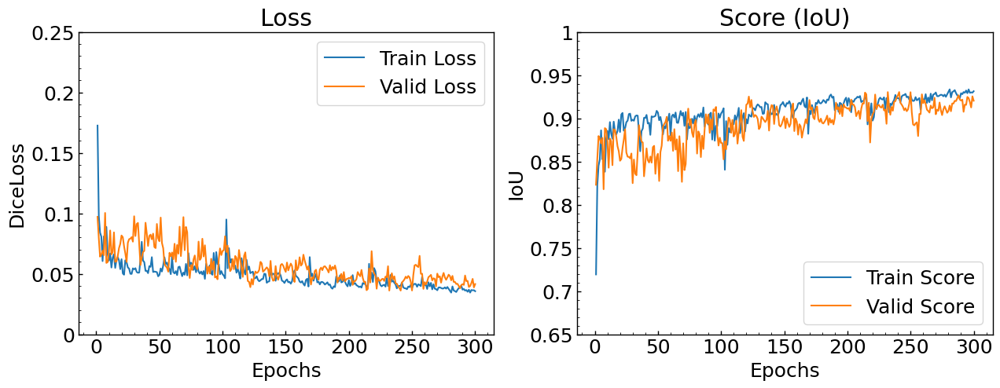

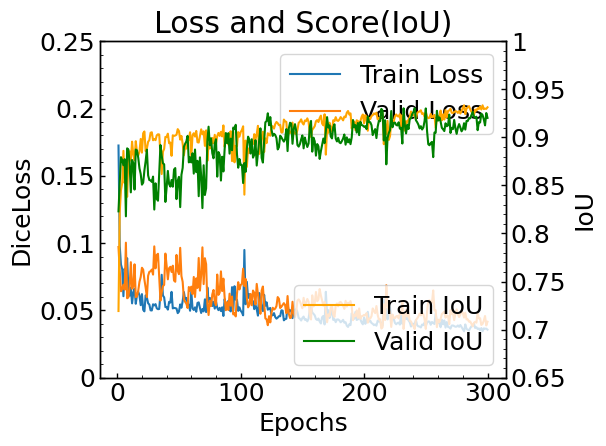

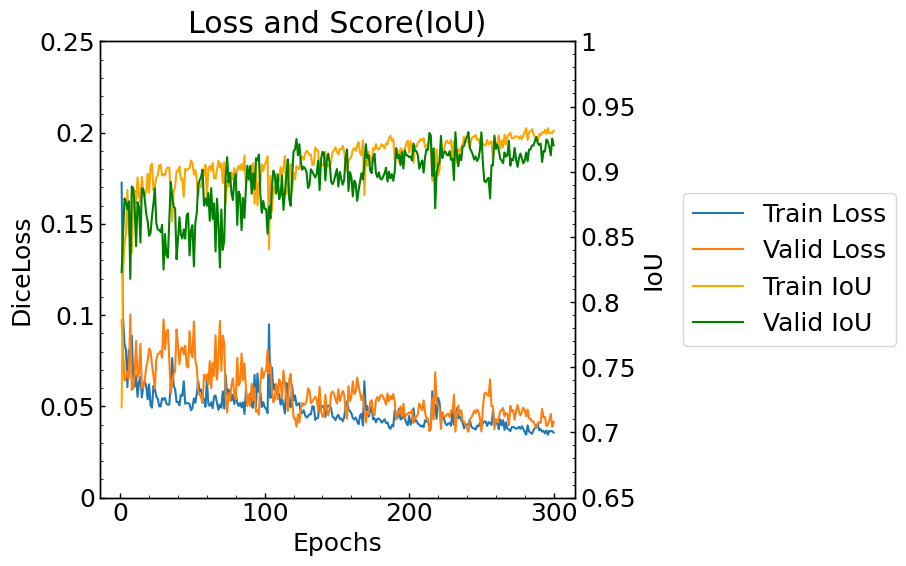

In [7]:
# # 数値の配列を文字列にして返す関数
# def convert_list_el_to_str_from_num(arr_num, num_decimals = 0):
#     arr_str = []
#     for num in arr_num:
#         if num_decimals == 0:
#             stg = str(num)
#         else:
#             stg = str(math.floor(num * 10 ** num_decimals) / (10 ** num_decimals))
#             while True:
#                 if not(stg[-1] in ["0", "."]):
#                     break
#                 elif stg == "0.0":
#                     stg = "0"
#                 else:
#                     stg = stg[:-1]

#         arr_str.append(stg)
#     return arr_str


def convert_list_el_to_str_from_num(arr_num, num_decimals=0):
    print(arr_num)
    arr_str = []
    for num in arr_num:
        if num_decimals == 0:
            stg = str(num)
        else:
            num_foor = math.floor(num * 10**num_decimals) / (10**num_decimals)
            print("num_foor:" + str(num_foor))
            stg = str(num_foor)
            print("stg:" + stg)
            while True:
                if not (stg[-1] in ["0", "."]):
                    break
                elif stg == "0.0":
                    stg = "0"
                    break
                else:
                    stg = stg[:-1]
                # pdb.set_trace()

        print("append:" + stg)
        arr_str.append(stg)
    return arr_str


plt.figure(1)
plt.figure(figsize=(15, 5))
# sns.set_style(style="darkgrid")

if const.NUM_EPOCHS < 20:
    arange_num = np.arange(1, const.NUM_EPOCHS + 1, step=1)
    arange_str = convert_list_el_to_str_from_num(arange_num)

    plt.xticks(arange_num, arange_str)
    plt.xlim(1, const.NUM_EPOCHS)
elif const.NUM_EPOCHS < 60:
    plt.xticks(np.arange(1, const.NUM_EPOCHS + 1, step=5))
    plt.xlim(0, const.NUM_EPOCHS)
else:
    plt.xticks(np.arange(1, const.NUM_EPOCHS + 1, step=10))
    plt.xlim(0, const.NUM_EPOCHS)


plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
plt.rcParams["xtick.major.width"] = 1.0
plt.rcParams["ytick.major.width"] = 1.0
plt.rcParams["font.size"] = 18
plt.rcParams["axes.linewidth"] = 1.0


plt.subplot(1, 2, 1)
arange_num = np.arange(0, 0.25 + 0.01, step=0.05)
# arange_str = convert_list_el_to_str_from_num(arange_num, 0)
# めんどくさいから自分で指定
arange_str = ["0", "0.05", "0.1", "0.15", "0.2", "0.25"]
plt.yticks(arange_num, arange_str)
plt.ylim(0, 0.25)
plt.minorticks_on()
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_train_loss, label="Train Loss")
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_valid_loss, label="Valid Loss")
plt.title("Loss")
plt.xlabel("Epochs")
plt.ylabel("DiceLoss")


plt.subplot(1, 2, 2)
arange_num = np.arange(0.65, 1 + 0.01, step=0.05)
# arange_str = convert_list_el_to_str_from_num(arange_num, 2)
arange_str = ["0.65", "0.7", "0.75", "0.8", "0.85", "0.9", "0.95", "1"]
# print(arange_str)
plt.yticks(arange_num, arange_str)
plt.ylim(0.65, 1)
plt.minorticks_on()
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_train_score, label="Train Score")
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_valid_score, label="Valid Score")
plt.title("Score (IoU)")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.show()


# y軸が2つで凡例がグラフ中にあるにあるグラフ
fig, ax1 = plt.subplots()

# サブプロットの間隔を調整
plt.subplots_adjust(right=0.8)

arange_num_loss = np.arange(0, 0.25 + 0.01, step=0.05)
arange_str_loss = ["0", "0.05", "0.1", "0.15", "0.2", "0.25"]
ax1.set_yticks(arange_num_loss, arange_str_loss)
ax1.set_ylim(0, 0.25)
ax1.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_train_loss, ax=ax1, label="Train Loss"
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_valid_loss, ax=ax1, label="Valid Loss"
)
ax1.set_title("Loss and Score(IoU)")
ax1.set_xlabel("Epochs")
ax1.set_ylabel("DiceLoss")

ax2 = ax1.twinx()
arange_num_iou = np.arange(0.65, 1 + 0.01, step=0.05)
arange_str_iou = ["0.65", "0.7", "0.75", "0.8", "0.85", "0.9", "0.95", "1"]
ax2.set_yticks(arange_num_iou, arange_str_iou)
ax2.set_ylim(0.65, 1)
ax2.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_train_score,
    ax=ax2,
    label="Train IoU",
    color="orange",
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_valid_score,
    ax=ax2,
    label="Valid IoU",
    color="green",
)
ax2.set_ylabel("IoU")

plt.tight_layout()
plt.xlabel("Epochs")
plt.show()


# y軸が2つで凡例がグラフ外にあるグラフ
fig, ax1 = plt.subplots(figsize=(10, 6))

# 損失のy軸目盛り設定
arange_num_loss = np.arange(0, 0.25 + 0.01, step=0.05)
arange_str_loss = ["0", "0.05", "0.1", "0.15", "0.2", "0.25"]
ax1.set_yticks(arange_num_loss, arange_str_loss)
ax1.set_ylim(0, 0.25)
ax1.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_train_loss, ax=ax1, label="Train Loss"
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_valid_loss, ax=ax1, label="Valid Loss"
)
ax1.set_title("Loss and Score(IoU)")
ax1.set_xlabel("Epochs")
ax1.set_ylabel("DiceLoss")

# IoUのy軸目盛り設定
ax2 = ax1.twinx()
arange_num_iou = np.arange(0.65, 1 + 0.01, step=0.05)
arange_str_iou = ["0.65", "0.7", "0.75", "0.8", "0.85", "0.9", "0.95", "1"]
ax2.set_yticks(arange_num_iou, arange_str_iou)
ax2.set_ylim(0.65, 1)
ax2.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_train_score,
    ax=ax2,
    label="Train IoU",
    color="orange",
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_valid_score,
    ax=ax2,
    label="Valid IoU",
    color="green",
)
ax2.set_ylabel("IoU")

# 凡例を右側に移動
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(
    lines1 + lines2, labels1 + labels2, loc="center left", bbox_to_anchor=(1.2, 0.5)
)

ax2.get_legend().remove()

plt.tight_layout()
plt.xlabel("Epochs")
plt.show()

In [8]:
# bestmodelの読み込み
checkpoint = torch.load(const.CHECKPOINT_PATH_UNet + best_model_file)
model.load_state_dict(checkpoint["state_dict"])
optimizer.load_state_dict(checkpoint["optimizer"])
start_epoch = checkpoint["epoch"]
valid_loss_min = checkpoint["valid_loss_min"]

[21, 6, 59, 58, 43, 51]


/tmp/ipykernel_2071/257942239.py:15: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  data = torch.autograd.Variable(data, volatile=True).cuda()
/tmp/ipykernel_2071/257942239.py:16: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  mask = torch.autograd.Variable(mask, volatile=True).cuda()


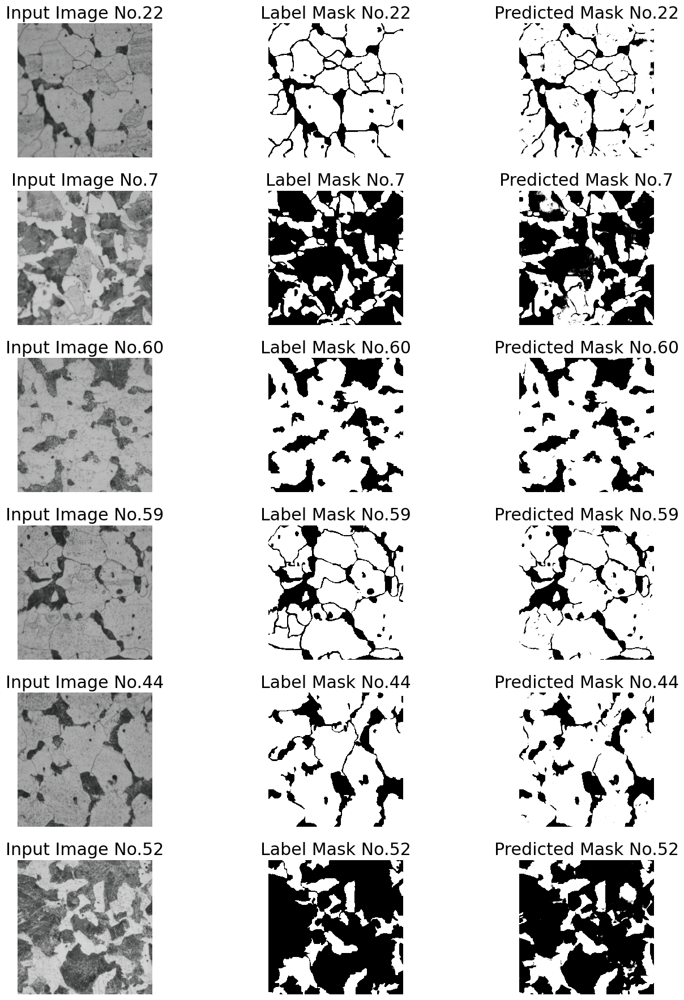

In [9]:
def visualize_predict(model, n_images, num_range):
    images = random.sample(range(0, num_range), n_images)
    print(images)
    figure, ax = plt.subplots(nrows=n_images, ncols=3, figsize=(15, 18))

    # now = datetime.now()
    # formatted_time = now.strftime("%Y%m%d%H%M")

    # output_directory = f"{const.APP_PATH}/tmp/{const.TRAIN_DIR}/{formatted_time}"
    # if not os.path.exists(output_directory):
    #     os.makedirs(output_directory)

    with torch.no_grad():
        for data, mask in val_loader:
            data = torch.autograd.Variable(data, volatile=True).cuda()
            mask = torch.autograd.Variable(mask, volatile=True).cuda()
            o = model(data)
            break
    for i in range(0, len(images)):
        img_no = images[i]
        tm = o[i][0].data.cpu().numpy()
        img = data[i].data.cpu().numpy()
        msk = mask[i].data.cpu().numpy()
        img = format_image(img)
        msk = format_mask(msk)
        ax[i, 0].imshow(img)
        ax[i, 1].imshow(msk, interpolation="nearest", cmap="gray")
        ax[i, 2].imshow(tm, interpolation="nearest", cmap="gray")
        ax[i, 0].set_title(f"Input Image No.{img_no+1}")
        ax[i, 1].set_title(f"Label Mask No.{img_no+1}")
        ax[i, 2].set_title(f"Predicted Mask No.{img_no+1}")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
        ax[i, 2].set_axis_off()
        # plt.imsave(f"{output_directory}/Input_Image_No_{img_no+1}.png", img)
        # plt.imsave(f"{output_directory}/Label_Mask_No_{img_no+1}.png", msk)
        # plt.imsave(f"{output_directory}/Predicted_Mask_No_{img_no+1}.png", tm)
    plt.tight_layout()
    plt.show()


visualize_predict(model, 6, num_range)

/tmp/ipykernel_2071/1379170779.py:15: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  data = torch.autograd.Variable(data, volatile=True).cuda()
/tmp/ipykernel_2071/1379170779.py:16: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  mask = torch.autograd.Variable(mask, volatile=True).cuda()


60


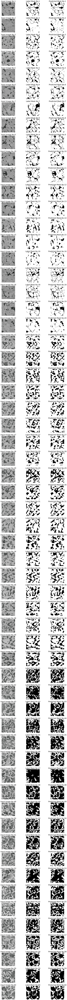

In [10]:
def visualize_full_predict(model):
    full_dataset = image_loader.LoadDataSet(
        setting.const.TRAIN_PATH,
        const.IMG_HEIGHT,
        const.IMG_WIDTH,
        transform=image_loader.get_train_transform(
            const.IMG_HEIGHT, const.IMG_WIDTH, horizontal_flip=0.0, vertical_flip=0.0
        ),
    )

    all_loader = DataLoader(dataset=full_dataset, batch_size=full_dataset.__len__())

    with torch.no_grad():
        for data, mask in all_loader:
            data = torch.autograd.Variable(data, volatile=True).cuda()
            mask = torch.autograd.Variable(mask, volatile=True).cuda()
            o = model(data)
            break

    n_images = len(data)
    print(n_images)
    figure, ax = plt.subplots(nrows=n_images, ncols=3, figsize=(15, 180))

    now = datetime.now()
    formatted_time = now.strftime("%Y%m%d%H%M")

    output_directory = f"{const.APP_PATH}/tmp/{const.TRAIN_DIR}/{formatted_time}"
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for i in range(0, len(data)):
        img_no = i
        tm = o[i][0].data.cpu().numpy()
        img = data[i].data.cpu().numpy()
        msk = mask[i].data.cpu().numpy()
        img = format_image(img)
        msk = format_mask(msk)
        ax[i, 0].imshow(img)
        ax[i, 1].imshow(msk, interpolation="nearest", cmap="gray")
        ax[i, 2].imshow(tm, interpolation="nearest", cmap="gray")
        ax[i, 0].set_title(f"Input Image No.{img_no+1}")
        ax[i, 1].set_title(f"Label Mask No.{img_no+1}")
        ax[i, 2].set_title(f"Predicted Mask No.{img_no+1}")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
        ax[i, 2].set_axis_off()
        plt.imsave(f"{output_directory}/Input_Image_No_{img_no+1}.png", img)
        plt.imsave(f"{output_directory}/Label_Mask_No_{img_no+1}.png", msk)
        plt.imsave(f"{output_directory}/Predicted_Mask_No_{img_no+1}.png", tm)
    plt.tight_layout()
    plt.show()


visualize_full_predict(model)